In [93]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import functools

pd.set_option('display.max_columns', None)

In [119]:
from pathlib import Path

FIGPATH=Path('../figures/waltzdb/')

In [68]:
raw_data = pd.read_csv('../data/waltzdb_export.csv')

# Feature explanation

## Protein Aggregation Prediction Methods:

**WALTZ, TANGO, PASTA parallel, PASTA antiparallel**: These are names of algorithms or methods specifically designed to predict protein aggregation propensity. They likely use different computational techniques to assess the likelihood of a sequence forming aggregates.

## Structural and Energetic Features:

**CF Helix, CF Strand**: These features might indicate the propensity of the sequence to form specific secondary structures, alpha-helices or beta-sheets, which can influence aggregation.

**Hydrophobicity**: This measures the overall hydrophobicity of the sequence, which is a key factor in protein folding and aggregation. Hydrophobic residues tend to cluster together, driving protein folding and potentially leading to aggregation.

**Position**: This might refer to the position of the sequence within a larger protein or the specific amino acid positions within the sequence.

**Class**: This could indicate the functional class or family of the protein from which the sequence is derived.

**Stability**: This might measure the thermodynamic stability of the sequence, which can influence its folding and aggregation behavior.

**Backbone Hbond, Electrostatic kon, Electrostatics**: These features likely relate to the hydrogen bonding and electrostatic interactions between amino acid residues, which can stabilize or destabilize protein structures and influence aggregation.

**Entropy Mainchain, Entropy Sidechain**: These features might measure the conformational entropy of the main chain and side chains, respectively. Higher entropy can indicate a more flexible and disordered structure, which can be associated with aggregation.

**Sidechain Hbond, Solvation Hydrophobic, Solvation Polar, VdW, VdW Clashes**: These features likely relate to the interactions between side chains, the solvent (water), and van der Waals forces. These interactions can influence protein folding and aggregation.

In [132]:
AMYLOID='amyloid'
DATA_NAN='N.A.'
STRING_COLUMNS=['Model', 'Sequence']
CLASS_MAPPING = {
    'class7': 7,
    'class1': 1,
}

In [100]:
def convert_to_nan(data: pd.DataFrame):
    data[data == DATA_NAN] = np.NaN
    return data

def convert_class_col(cls: int|str, str_mapping: dict[str, int]):
    v = str_mapping.get(cls)
    return v if v is not None else int(cls)

def drop_na_data(data: pd.DataFrame, ratio=0.1):
    data = convert_to_nan(data)
    total_nans = pd.isna(data).sum()
    total_nans = (total_nans/len(data)) < ratio
    indexes = total_nans[total_nans].index
    return data[indexes]
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection

N = 10
M = 11
ylabels = ["".join(np.random.choice(list("PQRSTUVXYZ"), size=7)) for _ in range(N)]
xlabels = ["".join(np.random.choice(list("ABCDE"), size=3)) for _ in range(M)]

x, y = np.meshgrid(np.arange(M), np.arange(N))
s = np.random.randint(0, 180, size=(N,M))
c = np.random.rand(N, M)-0.5

fig, ax = plt.subplots()

R = s/s.max()/2
circles = [plt.Circle((j,i), radius=r) for r, j, i in zip(R.flat, x.flat, y.flat)]
col = PatchCollection(circles, array=c.flatten(), cmap="RdYlGn")
ax.add_collection(col)

ax.set(xticks=np.arange(M), yticks=np.arange(N),
       xticklabels=xlabels, yticklabels=ylabels)
ax.set_xticks(np.arange(M+1)-0.5, minor=True)
ax.set_yticks(np.arange(N+1)-0.5, minor=True)
ax.grid(which='minor')

fig.colorbar(col)
plt.show()
def treat_data(data, exclude=None, **kwargs):
    exclude = exclude if exclude else list()
    data = data.copy()
    data = drop_na_data(data, **kwargs)
    data = data.drop(exclude, axis=1)
    data['Class'] = data['Class'].map(functools.partial(convert_class_col, str_mapping=CLASS_MAPPING))
    return data

In [101]:
data = treat_data(raw_data, exclude=STRING_COLUMNS)

<Figure size 6000x6000 with 0 Axes>

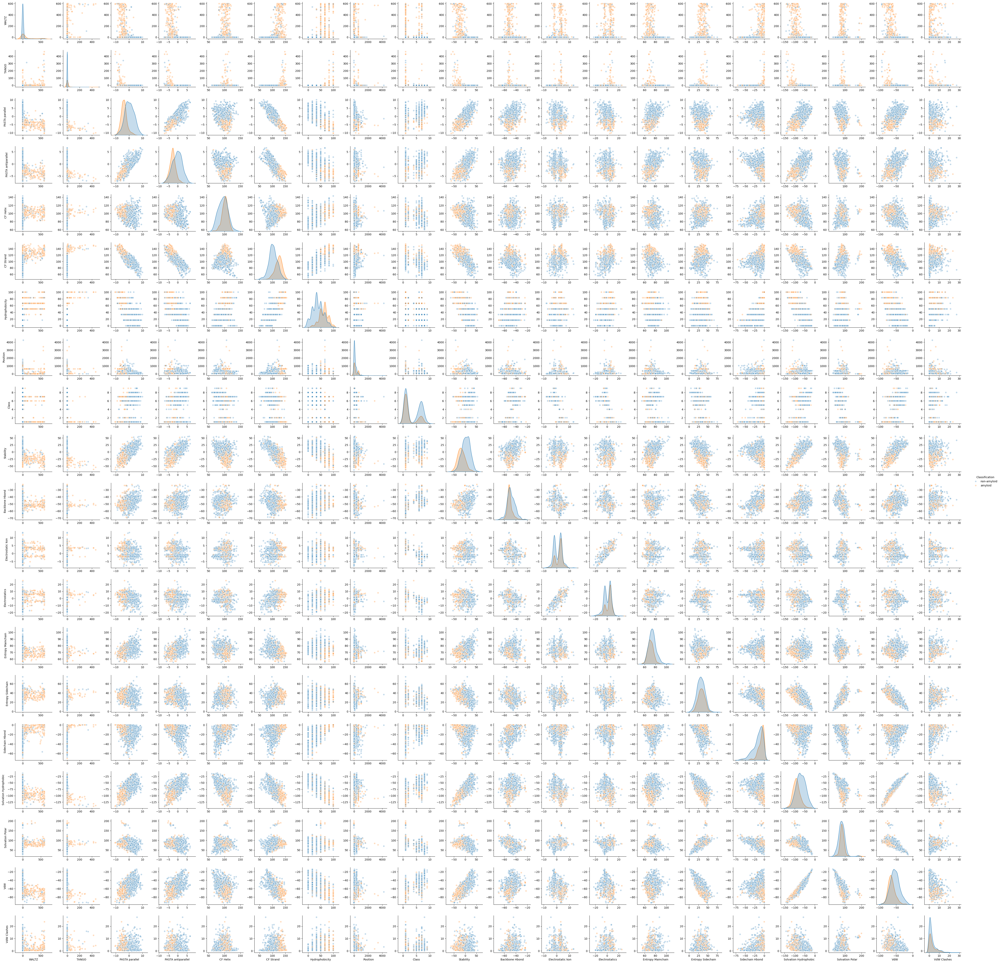

In [124]:
fig = plt.figure(figsize=(60,60))

pp = sns.pairplot(data, kind='scatter', hue='Classification', plot_kws=dict(edgecolor="white", linewidth=2.5, alpha=0.3))

for ax in pp.axes.flat:
    ax.tick_params(axis='both', labelleft=True, labelbottom=True)
    
plt.subplots_adjust(wspace=0.3, hspace=0.3)

plt.savefig(FIGPATH/'pairplot.png', dpi=300)

plt.show()

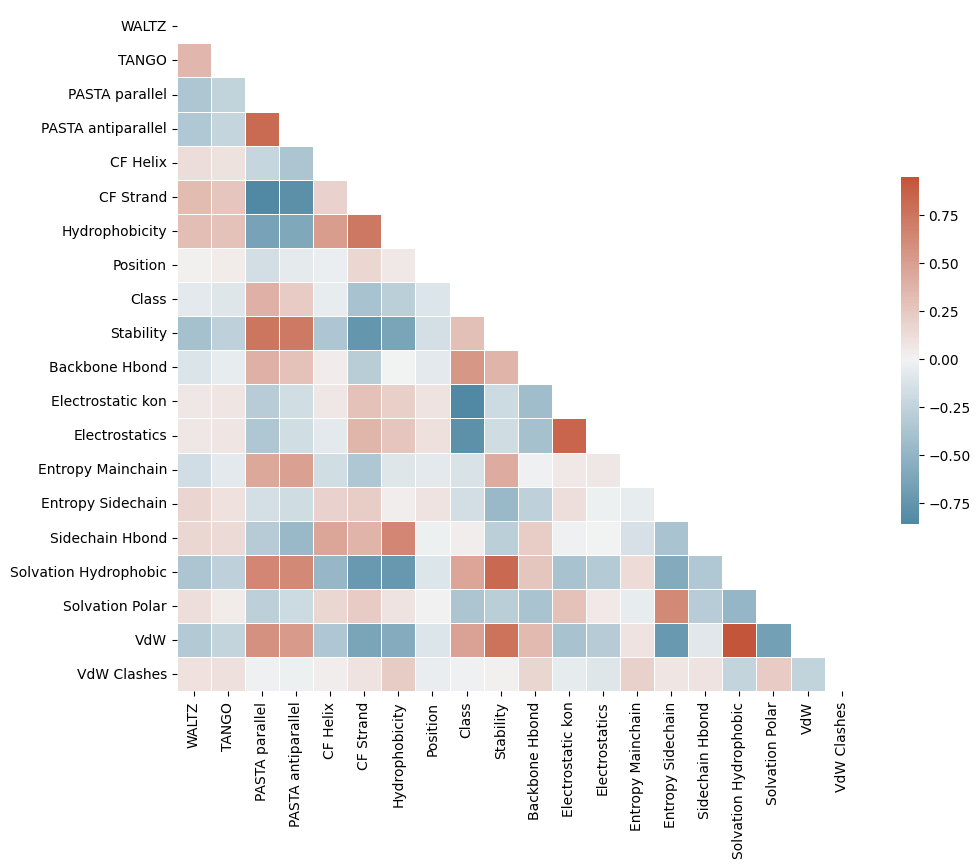

In [123]:
corr = data.drop(['Classification'], axis=1).corr()

fig, ax = plt.subplots(figsize=(11, 9))
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask,cmap=cmap, square=True, center=0, linewidths=.5, cbar_kws={"shrink": .5})

fig.savefig(FIGPATH/'correlation_heatmap.png')

In [137]:
(~mask).shape

(20, 20)

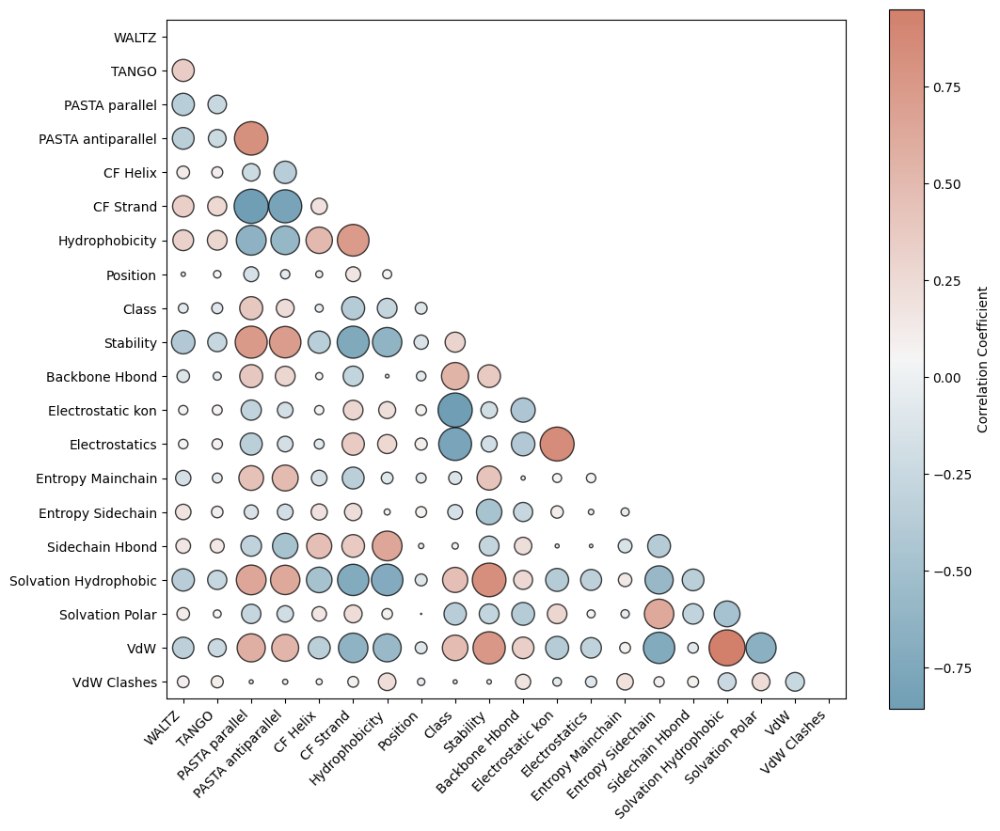

In [134]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
corr = data.drop(['Classification'], axis=1).corr()

fig, ax = plt.subplots(figsize=(11, 9))
mask = np.triu(np.ones_like(corr, dtype=bool))

# Create a scatter-plot-style heatmap
x, y = np.meshgrid(range(corr.shape[1]), range(corr.shape[0]))
x, y = x[~mask], y[~mask]  # Mask upper triangle

# Flatten the correlation values for plotting
correlation_values = corr.values[~mask]

# Normalize circle sizes
circle_sizes = 800 * np.abs(correlation_values)  # Scale for visibility
colors = correlation_values  # Use correlation values as colors

# Scatter plot of circles
sc = ax.scatter(x, y, s=circle_sizes, c=colors, cmap=cmap, alpha=0.75, edgecolor="k")

# Add colorbar
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Correlation Coefficient')

# Format the plot
ax.set_xticks(range(corr.shape[1]))
ax.set_yticks(range(corr.shape[0]))
ax.set_xticklabels(corr.columns, rotation=45, ha='right')
ax.set_yticklabels(corr.index)
ax.set_xlim(-0.5, corr.shape[1] - 0.5)
ax.set_ylim(-0.5, corr.shape[0] - 0.5)
ax.invert_yaxis()  # Align the axis like a heatmap
ax.set_aspect('equal', adjustable='box')

plt.tight_layout()

# Save the figure
fig.savefig(FIGPATH / 'correlation_circle_heatmap.png')


Classification            object
WALTZ                    float64
TANGO                    float64
PASTA parallel           float64
PASTA antiparallel       float64
CF Helix                 float64
CF Strand                float64
Hydrophobicity           float64
Position                 float64
Class                      int64
Stability                float64
Backbone Hbond           float64
Electrostatic kon        float64
Electrostatics           float64
Entropy Mainchain        float64
Entropy Sidechain        float64
Sidechain Hbond          float64
Solvation Hydrophobic    float64
Solvation Polar          float64
VdW                      float64
VdW Clashes              float64
dtype: object

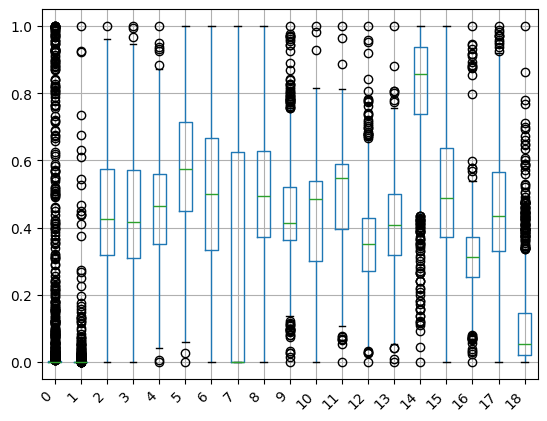

In [182]:
from sklearn.preprocessing import MinMaxScaler

def boxplot(data):
    data = pd.DataFrame(MinMaxScaler().fit_transform(data.dropna()))
    fig, ax = plt.subplots(1)
    data.boxplot(ax=ax)
    ax.set_xticklabels(data.columns, rotation=45, ha='right')
    
boxplot(data.drop(['Position', 'Classification'],axis=1))

In [181]:
pd.DataFrame(MinMaxScaler().fit_transform(data.drop(['Position', 'Classification'],axis=1).dropna()))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,0.000000,0.0,0.658991,0.709863,0.925030,0.363118,0.833,0.750,0.688073,0.589099,0.292453,0.388309,0.405941,0.086420,0.957447,0.795088,0.156647,0.773869,0.080586
1,0.000000,0.0,0.623714,0.687545,0.724305,0.346958,0.500,0.000,0.533778,0.400419,0.466981,0.494781,0.514851,0.289438,0.875177,0.511128,0.328324,0.471106,0.000000
2,0.000000,0.0,0.405683,0.449244,0.709794,0.569392,0.833,0.000,0.516264,0.392034,0.660377,0.647182,0.528713,0.341564,1.000000,0.295472,0.399422,0.248744,0.025641
3,0.000000,0.0,0.540421,0.557235,0.507860,0.502852,0.667,0.500,0.544621,0.706499,0.325472,0.440501,0.322772,0.189300,1.000000,0.645434,0.119075,0.672111,0.087912
4,0.000000,0.0,0.364037,0.486681,0.616687,0.594106,0.667,0.000,0.499583,0.366876,0.490566,0.572025,0.572277,0.395062,0.804255,0.466616,0.305780,0.443467,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1401,0.108870,0.0,0.397354,0.284377,0.399033,0.697719,0.667,0.750,0.353628,0.524109,0.344340,0.348643,0.259406,0.521262,0.817021,0.346124,0.356069,0.292714,0.326007
1402,0.000000,0.0,0.345419,0.233981,0.322854,0.627376,0.500,0.000,0.640534,0.440252,0.471698,0.668058,0.386139,0.318244,0.944681,0.537989,0.316185,0.461055,0.007326
1403,0.000000,0.0,0.400784,0.507559,0.093108,0.653042,0.500,0.000,0.519600,0.368973,0.542453,0.684760,0.423762,0.559671,0.490780,0.392172,0.470520,0.204774,0.344322
1404,0.806269,0.0,0.526213,0.405328,0.270859,0.719582,0.500,0.000,0.506255,0.404612,0.542453,0.672234,0.392079,0.713306,0.441135,0.380660,0.447977,0.206030,0.333333
